# Analyze a video

The functions avaliabe in this notebook allow you to quickly analyze the performance of hrnet and wrnch vs the ground truth


#### To prep a video for analysis:
1. Process the video with TuMeke_Testing_Framework.ipynb to store the pickled hrnet joints
2. Process the video on FS instance to get pickled Posenet joints.
3. Upload Posenet joints to work_dirs/tumeke_testing/posenet_pickle_files
4. Upload the image files in - work_dirs/tumeke_testing/ground_truth_images
5. Upload the full annotation file from label studio to - work_dirs/tumeke_testing/ground_truth_labels
6. Upload the wrnch .json file to - work_dirs/tumeke_testing/wrnch_jsons

<b>Important note</b>:
- Make sure the files in everything above have the same base name (e.g. test.json, test.p), except ground truth labels. Ground truth labels must have whatever names was used in label studio.

#### To format the raw data for analysis,  you have the following functions:
1. <b>get_hrnet_wrnch_dfs</b>: Formats Hrnet and Wrnch data into a dataframe index by frame for easy analysis
2. <b>get_gt_df</b>: Formats ground truth data  into a dataframe index by frame for easy analysis

#### To analyze the videos, you have the following functions:
1. <b>visualize_df_scores</b>: Visualize the scores of the hrnet data frame
2. <b>visualize_overlap</b>: Visualize a specific frame and the keypoints from Ground Truth, Hrnet, and Wrnch
3. <b>pck_calc</b>: Output summary stats on PCK (Percentage Correct Keypoints) for Ground Truth, Hrnet, and Wrnch
4. <b>pcp_calc</b>: Output summary stats on PCP (Percentage Correct Parts) for Ground Truth, Hrnet, and Wrnch
5. <b>smoothness_calc</b>: Output summary stats on smoothness between frames for each joint

In [2]:
from tumeke_testing_modules.load_model_data import get_hrnet_posenet_wrnch_dfs
from tumeke_testing_modules.load_gt_data import get_gt_df
from tumeke_testing_modules.visualize_frame import visualize_overlap, get_size
from tumeke_testing_modules.pck_calc import pck_calc, get_ed_by_frame, extract_j_pos, get_torso_diameter
from tumeke_testing_modules.pcp_calc import pcp_calc
from tumeke_testing_modules.visualize_df_scores import visualize_df_scores
from tumeke_testing_modules.smoothness_calc import smoothness_calc

### Load Data

In [5]:
# file = 'AFG_subject_switching_close_nurses_subjects1_partial'
file = 'MERCER_box_slamming1'

# MAKE SURE YOU UPDATE THIS WHEN CHANGING VIDEOS!
multiple_subjects = False
gt_df = get_gt_df(file, multiple_subjects)
shape = get_size(gt_df, file)
height, width = shape[:2]
print(height, width)
hrnet_df, posenet_df, wrnch_df = get_hrnet_posenet_wrnch_dfs(file, width, height)


ground truth loaded and formatted
gt_df shape: (877, 54)
720 480
hrnet data loaded
wrnch data loaded
hrnet data formatted
hrnet_df shape: (2494, 76)
posenet data formatted
posenet_df shape: (2494, 76)
wrnch data formatted
wrnch_df shape: (2494, 76)


### Analyze

In [ ]:
visualize_df_scores(hrnet_df)

In [ ]:
visualize_overlap(gt_df, [hrnet_df, posenet_df, wrnch_df], ["hrnet", "posenet", "wrnch"], 600)


PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 72.67%
hrnet | PCK - Total (detected frames): 81.09%
hrnet | PCK - By Body part (all frames):
Nose_ed          73.888255
L_Eye_ed         37.172178
R_Eye_ed         68.415051
L_Ear_ed         27.366021
R_Ear_ed         75.940707
L_Shoulder_ed    70.239453
R_S

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 57.78%
posenet | PCK - Total (detected frames): 64.80%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.46%
wrnch | PCK - Total (all frames): 66.68%
wrnch | PCK - Total (detected frames): 76.24%
wrnch | PCK - By Body part (all frames):
Nose_ed          68.415051
L_Eye_ed         35.005701
R_Eye_ed         62.599772
L_Ear_ed         32.269099
R_Ear_ed         67.388826
L_Shoulder_ed    71.493729
R_Shoulder_ed    76.852908
L_Elbow_ed       63.740023
R_Elbow_ed       71.265678
L_Wrist_ed       60.433295
R_Wrist_ed       69.327252
L_Hip_ed         77.651083
R_Hip_ed         77.080958
L_Knee_ed        76.738883
R_Knee_ed        74.686431
L_Ankle_ed       73.204105
R_Ankle_ed       75.370582
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          78.226858
L_Eye_ed         40.026076
R_Eye_ed         71.577575
L_Ear_ed         36.897001
R_Ear_ed         77.053455
L_Shoulder_ed    81.747066
R_Shoulder_ed    87.874837
L_Elbow_ed       72.881356
R_Elbow_ed       81.486310
L_Wrist_ed       69.100391

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------


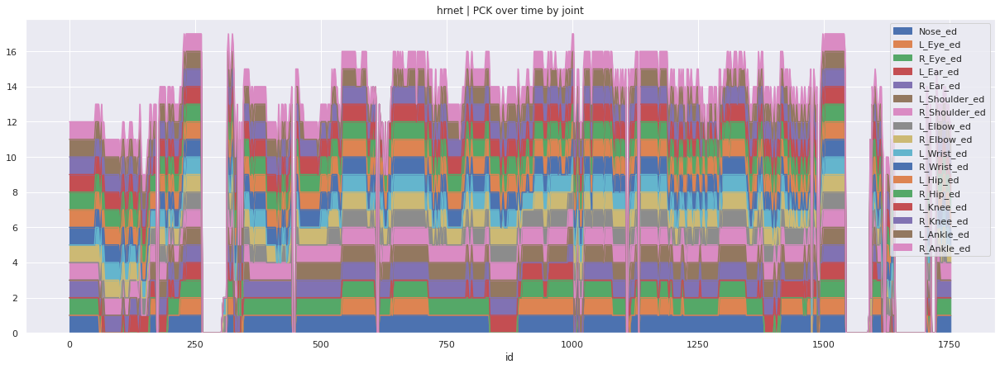

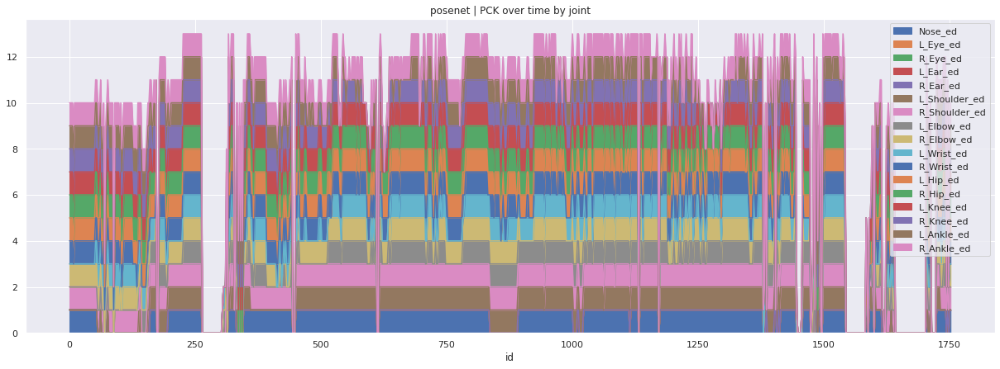

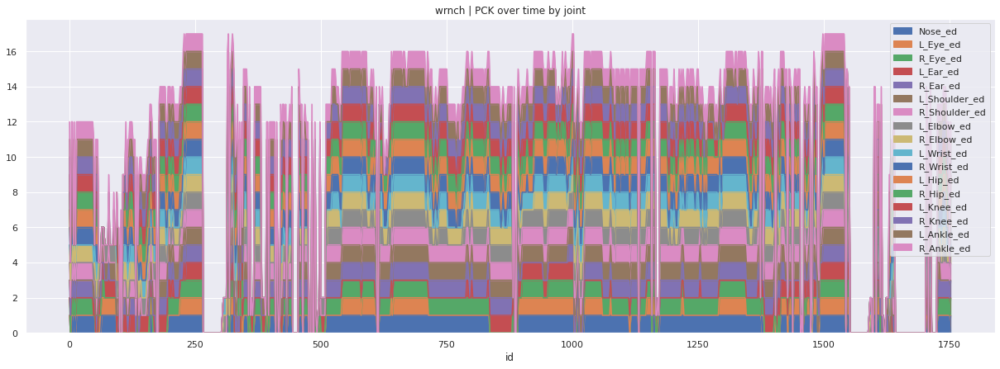

In [6]:
summary = pck_calc(gt_df, [hrnet_df, posenet_df, wrnch_df], ["hrnet", "posenet", "wrnch"], threshold=0)

In [ ]:
pcp_calc(gt_df, hrnet_df, wrnch_df)

skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
----------
hrnet | Median distance between joints and previous frame by joint:
----------
                       0
nose            3.225735
left_eye        3.184053
right_eye       3.342520
left_ear        3.399769
right_ear       3.334012
left_shoulder   3.091576
right_shoulder  3.180098
left_elbow      4.426562
right_elbow     4.716106
left_wrist      5.294819
right_wrist     5.873284
left_hip        3.044716
right_hip       2.853022
left_knee       3.131026
right_knee      3.104623
left_ankle      3.305401
right_ankle     3.258570
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2493
skiped row 2

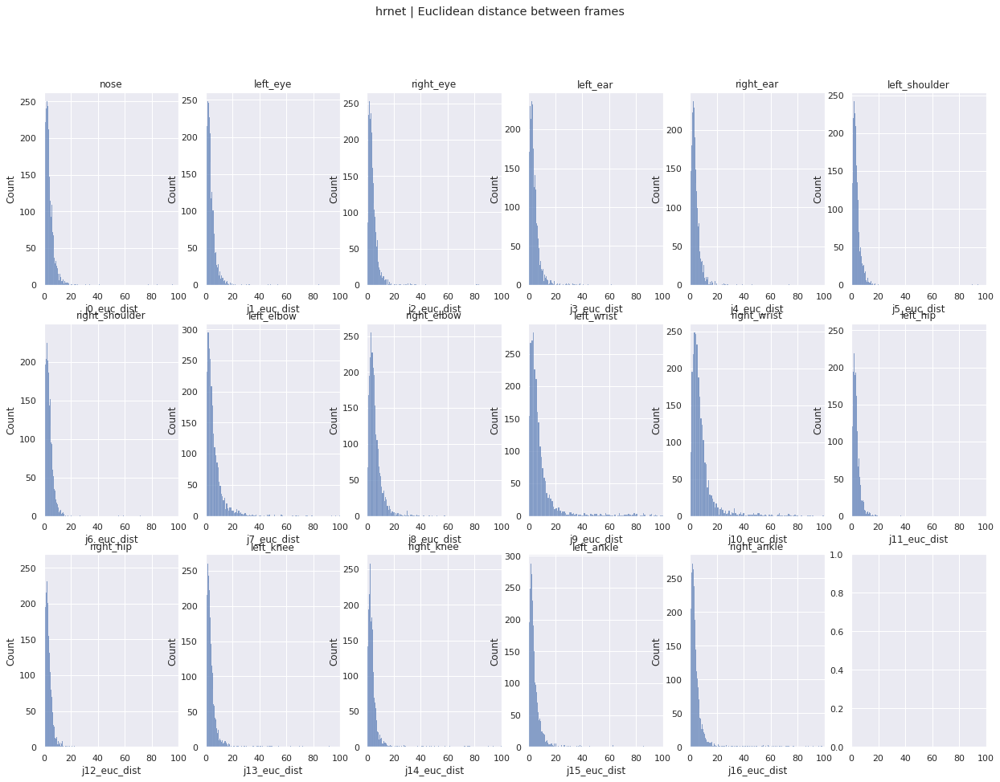

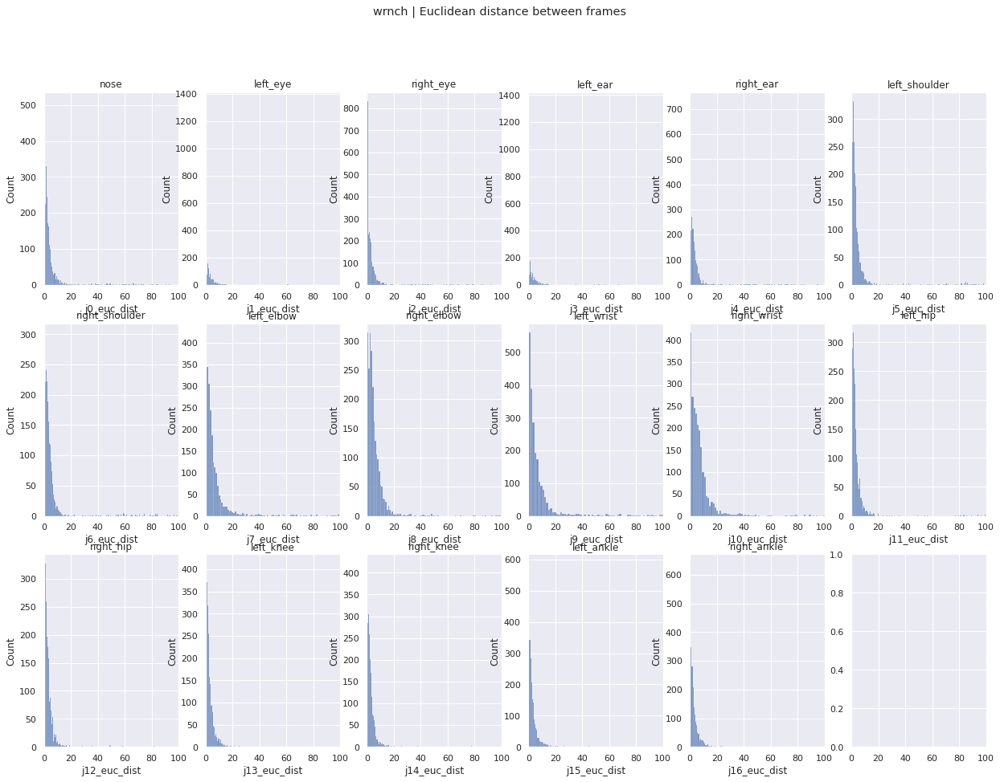

In [10]:
smoothness_calc(gt_df, hrnet_df, wrnch_df)

### Aggregate

ground truth loaded and formatted
gt_df shape: (756, 54)
hrnet data loaded
wrnch data loaded
hrnet data formatted
hrnet_df shape: (1513, 76)
posenet data formatted
posenet_df shape: (1513, 76)
wrnch data formatted
wrnch_df shape: (1513, 76)

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------


/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 49.60%
hrnet | PCK - Total (all frames): 35.18%
hrnet | PCK - Total (detected frames): 64.83%
hrnet | PCK - By Body part (all frames):
Nose_ed          50.795948
L_Eye_ed         50.795948
R_Eye_ed         51.230101
L_Ear_ed         51.664255
R_Ear_ed         52.243126
L_Shoulder_ed    50.506512
R_Shoulder_ed    49.927641
L_Elbow_ed       47.322721
R_Elbow_ed       37.626628
L_Wrist_ed       42.402315
R_Wrist_ed       28.654124
L_Hip_ed         27.641100
R_Hip_ed         30.969609
L_Knee_ed         5.209841
R_Knee_ed         6.512301
L_Ankle_ed        9.840810
R_Ankle_ed        4.775687
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          93.600000
L_Eye_ed         93.600000
R_Eye_ed         94.400000
L_Ear_ed         95.200000
R_Ear_ed         96.266667
L_Shoulder_ed    93.066667
R_Shoulder_ed    92.000000
L_Elbow_ed       87.200000
R_Elbow_ed       69.333333
L_Wrist_ed       78.133333
R_Wrist_ed       52.800000
L_Hip_ed         50.9

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 80.03%
posenet | PCK - Total (all frames): 29.79%
posenet | PCK - Total (detected frames): 35.01%
posenet | PCK - By Body part (all frames):
Nose_ed          50.210970
L_Eye_ed          0.140647
R_Eye_ed          0.140647
L_Ear_ed          0.281294
R_Ear_ed          0.281294
L_Shoulder_ed    64.416315
R_Shoulder_ed    62.025316
L_Elbow_ed       71.026723
R_Elbow_ed       61.603376
L_Wrist_ed       50.210970
R_Wrist_ed       40.646976
L_Hip_ed         40.787623
R_Hip_ed         41.350211
L_Knee_ed         8.157525
R_Knee_ed         7.454290
L_Ankle_ed        3.938115
R_Ankle_ed        3.797468
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          59.008264
L_Eye_ed          0.165289
R_Eye_ed          0.165289
L_Ear_ed          0.330579
R_Ear_ed          0.330579
L_Shoulder_ed    75.702479
R_Shoulder_ed    72.892562
L_Elbow_ed       83.471074
R_Elbow_ed       72.396694
L_Wrist_ed       59.008264
R_Wrist_ed       47.768595
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 63.36%
wrnch | PCK - Total (all frames): 35.74%
wrnch | PCK - Total (detected frames): 53.05%
wrnch | PCK - By Body part (all frames):
Nose_ed          41.631505
L_Eye_ed         40.928270
R_Eye_ed         36.427567
L_Ear_ed         55.274262
R_Ear_ed         46.272855
L_Shoulder_ed    58.087201
R_Shoulder_ed    56.399437
L_Elbow_ed       51.898734
R_Elbow_ed       45.991561
L_Wrist_ed       37.412096
R_Wrist_ed       36.286920
L_Hip_ed         33.895921
R_Hip_ed         34.739803
L_Knee_ed        13.783404
R_Knee_ed         6.047820
L_Ankle_ed        9.142053
R_Ankle_ed        3.375527
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          61.795407
L_Eye_ed         60.751566
R_Eye_ed         54.070981
L_Ear_ed         82.045929
R_Ear_ed         68.684760
L_Shoulder_ed    86.221294
R_Shoulder_ed    83.716075
L_Elbow_ed       77.035491
R_Elbow_ed       68.267223
L_Wrist_ed       55.532359
R_Wrist_ed       53.862213
L_Hip_ed         50.3

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 49.60%
hrnet | PCK - Total (all frames): 37.86%
hrnet | PCK - Total (detected frames): 68.29%
hrnet | PCK - By Body part (all frames):
Nose_ed          50.943396
L_Eye_ed         50.869565
R_Eye_ed         51.378810
L_Ear_ed         51.739130
R_Ear_ed         52.318841
L_Shoulder_ed    50.579710
R_Shoulder_ed    50.291545
L_Elbow_ed       49.846626
R_Elbow_ed       38.370370
L_Wrist_ed       45.525903
R_Wrist_ed       31.680000
L_Hip_ed         29.475309
R_Hip_ed         32.973806
L_Knee_ed         5.924596
R_Knee_ed         6.423611
L_Ankle_ed       13.333333
R_Ankle_ed        5.436893
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          93.600000
L_Eye_ed         93.600000
R_Eye_ed         94.400000
L_Ear_ed         95.200000
R_Ear_ed         96.266667
L_Shoulder_ed    93.315508
R_Shoulder_ed    92.245989
L_Elbow_ed       90.529248
R_Elbow_ed       71.745152
L_Wrist_ed       80.779944
R_Wrist_ed       56.571429
L_Hip_ed         53.8

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 79.50%
posenet | PCK - Total (all frames): 38.89%
posenet | PCK - Total (detected frames): 46.01%
posenet | PCK - By Body part (all frames):
Nose_ed          50.210970
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    64.416315
R_Shoulder_ed    62.025316
L_Elbow_ed       71.026723
R_Elbow_ed       61.603376
L_Wrist_ed       50.210970
R_Wrist_ed       40.646976
L_Hip_ed         40.787623
R_Hip_ed         41.350211
L_Knee_ed         8.157525
R_Knee_ed         7.454290
L_Ankle_ed        3.938115
R_Ankle_ed        3.797468
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          59.400998
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    76.206323
R_Shoulder_ed    73.377704
L_Elbow_ed       84.026622
R_Elbow_ed       72.878536
L_Wrist_ed       59.400998
R_Wrist_ed       48.086522
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 63.23%
wrnch | PCK - Total (all frames): 43.41%
wrnch | PCK - Total (detected frames): 62.04%
wrnch | PCK - By Body part (all frames):
Nose_ed          45.230769
L_Eye_ed         47.549020
R_Eye_ed         46.028881
L_Ear_ed         59.442724
R_Ear_ed         64.669421
L_Shoulder_ed    59.084406
R_Shoulder_ed    57.864358
L_Elbow_ed       58.505564
R_Elbow_ed       63.850688
L_Wrist_ed       48.794063
R_Wrist_ed       53.829787
L_Hip_ed         34.477825
R_Hip_ed         35.590778
L_Knee_ed        15.136054
R_Knee_ed         6.297710
L_Ankle_ed       11.555556
R_Ankle_ed        5.504587
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          63.225806
L_Eye_ed         65.688488
R_Eye_ed         64.885496
L_Ear_ed         88.479263
R_Ear_ed         96.604938
L_Shoulder_ed    87.130802
R_Shoulder_ed    84.421053
L_Elbow_ed       79.826464
R_Elbow_ed       82.278481
L_Wrist_ed       63.221154
R_Wrist_ed       67.108753
L_Hip_ed         50.9

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 48.94%
hrnet | PCK - Total (all frames): 41.70%
hrnet | PCK - Total (detected frames): 77.04%
hrnet | PCK - By Body part (all frames):
Nose_ed          51.098097
L_Eye_ed         50.877193
R_Eye_ed         51.395007
L_Ear_ed         52.052786
R_Ear_ed         53.384615
L_Shoulder_ed    52.735562
R_Shoulder_ed    50.300300
L_Elbow_ed       54.180602
R_Elbow_ed       44.117647
L_Wrist_ed       55.646817
R_Wrist_ed       44.341801
L_Hip_ed         31.293706
R_Hip_ed         35.763889
L_Knee_ed         5.720824
R_Knee_ed         5.213270
L_Ankle_ed        0.343643
R_Ankle_ed        0.743494
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          95.355191
L_Eye_ed         94.822888
R_Eye_ed         96.153846
L_Ear_ed         96.467391
R_Ear_ed         97.471910
L_Shoulder_ed    96.388889
R_Shoulder_ed    93.055556
L_Elbow_ed       92.307692
R_Elbow_ed       87.209302
L_Wrist_ed       89.438944
R_Wrist_ed       85.333333
L_Hip_ed         54.4

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 79.50%
posenet | PCK - Total (all frames): 38.89%
posenet | PCK - Total (detected frames): 46.01%
posenet | PCK - By Body part (all frames):
Nose_ed          50.210970
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    64.416315
R_Shoulder_ed    62.025316
L_Elbow_ed       71.026723
R_Elbow_ed       61.603376
L_Wrist_ed       50.210970
R_Wrist_ed       40.646976
L_Hip_ed         40.787623
R_Hip_ed         41.350211
L_Knee_ed         8.157525
R_Knee_ed         7.454290
L_Ankle_ed        3.938115
R_Ankle_ed        3.797468
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          59.400998
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    76.206323
R_Shoulder_ed    73.377704
L_Elbow_ed       84.026622
R_Elbow_ed       72.878536
L_Wrist_ed       59.400998
R_Wrist_ed       48.086522
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 62.96%
wrnch | PCK - Total (all frames): 48.25%
wrnch | PCK - Total (detected frames): 72.20%
wrnch | PCK - By Body part (all frames):
Nose_ed          48.592871
L_Eye_ed         48.054475
R_Eye_ed         48.205128
L_Ear_ed         62.068966
R_Ear_ed         67.957746
L_Shoulder_ed    60.352423
R_Shoulder_ed    59.790732
L_Elbow_ed       63.809524
R_Elbow_ed       67.056075
L_Wrist_ed       57.142857
R_Wrist_ed       63.914373
L_Hip_ed         35.143770
R_Hip_ed         36.423841
L_Knee_ed        14.242424
R_Knee_ed         2.242152
L_Ankle_ed        4.060914
R_Ankle_ed        0.641026
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          65.736041
L_Eye_ed         65.866667
R_Eye_ed         66.197183
L_Ear_ed         90.265487
R_Ear_ed         96.984925
L_Shoulder_ed    88.197425
R_Shoulder_ed    86.206897
L_Elbow_ed       86.563307
R_Elbow_ed       88.307692
L_Wrist_ed       76.119403
R_Wrist_ed       78.277154
L_Hip_ed         52.2

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 48.81%
hrnet | PCK - Total (all frames): 45.89%
hrnet | PCK - Total (detected frames): 87.33%
hrnet | PCK - By Body part (all frames):
Nose_ed          50.934579
L_Eye_ed         50.231839
R_Eye_ed         50.693374
L_Ear_ed         52.276295
R_Ear_ed         55.494505
L_Shoulder_ed    55.852843
R_Shoulder_ed    52.922078
L_Elbow_ed       65.000000
R_Elbow_ed       46.759259
L_Wrist_ed       70.754717
R_Wrist_ed       47.428571
L_Hip_ed         27.170868
R_Hip_ed         33.421053
L_Knee_ed         5.645161
R_Knee_ed         3.720930
L_Ankle_ed        0.512821
R_Ankle_ed        1.257862
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          96.460177
L_Eye_ed         95.870206
R_Eye_ed         96.480938
L_Ear_ed         97.368421
R_Ear_ed         98.058252
L_Shoulder_ed    97.093023
R_Shoulder_ed    93.678161
L_Elbow_ed       93.730408
R_Elbow_ed       92.237443
L_Wrist_ed       92.975207
R_Wrist_ed       94.318182
L_Hip_ed         51.0

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 79.50%
posenet | PCK - Total (all frames): 38.89%
posenet | PCK - Total (detected frames): 46.01%
posenet | PCK - By Body part (all frames):
Nose_ed          50.210970
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    64.416315
R_Shoulder_ed    62.025316
L_Elbow_ed       71.026723
R_Elbow_ed       61.603376
L_Wrist_ed       50.210970
R_Wrist_ed       40.646976
L_Hip_ed         40.787623
R_Hip_ed         41.350211
L_Knee_ed         8.157525
R_Knee_ed         7.454290
L_Ankle_ed        3.938115
R_Ankle_ed        3.797468
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          59.400998
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    76.206323
R_Shoulder_ed    73.377704
L_Elbow_ed       84.026622
R_Elbow_ed       72.878536
L_Wrist_ed       59.400998
R_Wrist_ed       48.086522
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 61.64%
wrnch | PCK - Total (all frames): 51.30%
wrnch | PCK - Total (detected frames): 79.50%
wrnch | PCK - By Body part (all frames):
Nose_ed          48.825065
L_Eye_ed         51.549296
R_Eye_ed         51.452282
L_Ear_ed         64.102564
R_Ear_ed         78.048780
L_Shoulder_ed    64.569536
R_Shoulder_ed    62.056738
L_Elbow_ed       67.191601
R_Elbow_ed       70.029674
L_Wrist_ed       59.842520
R_Wrist_ed       70.297030
L_Hip_ed         35.817308
R_Hip_ed         34.615385
L_Knee_ed        10.659898
R_Knee_ed         0.000000
L_Ankle_ed        1.973684
R_Ankle_ed        0.000000
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          64.705882
L_Eye_ed         68.029740
R_Eye_ed         65.263158
L_Ear_ed         92.592593
R_Ear_ed         97.560976
L_Shoulder_ed    91.121495
R_Shoulder_ed    87.281796
L_Elbow_ed       91.756272
R_Elbow_ed       92.913386
L_Wrist_ed       85.393258
R_Wrist_ed       89.873418
L_Hip_ed         56.4

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

posenet | % Detected frames: 82.27%
posenet | PCK - Total (all frames): 33.80%
posenet | PCK - Total (detected frames): 40.18%
posenet | PCK - By Body part (all frames):
Nose_ed          81.308411
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    81.869159
R_Shoulder_ed    63.177570
L_Elbow_ed       75.700935
R_Elbow_ed       30.467290
L_Wrist_ed       72.523364
R_Wrist_ed       37.196262
L_Hip_ed         54.579439
R_Hip_ed         31.775701
L_Knee_ed         8.411215
R_Knee_ed         6.355140
L_Ankle_ed       29.158879
R_Ankle_ed        2.056075
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          96.666667
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    97.333333
R_Shoulder_ed    75.111111
L_Elbow_ed       90.000000
R_Elbow_ed       36.222222
L_Wrist_ed       86.222222
R_Wrist_ed       44.222222
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 92.69%
hrnet | PCK - Total (all frames): 46.62%
hrnet | PCK - Total (detected frames): 49.16%
hrnet | PCK - By Body part (all frames):
Nose_ed          78.342750
L_Eye_ed         84.141791
R_Eye_ed         24.112150
L_Ear_ed         82.739212
R_Ear_ed         16.415094
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

posenet | % Detected frames: 82.27%
posenet | PCK - Total (all frames): 44.20%
posenet | PCK - Total (detected frames): 52.55%
posenet | PCK - By Body part (all frames):
Nose_ed          81.308411
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    81.869159
R_Shoulder_ed    63.177570
L_Elbow_ed       75.700935
R_Elbow_ed       30.467290
L_Wrist_ed       72.523364
R_Wrist_ed       37.196262
L_Hip_ed         54.579439
R_Hip_ed         31.775701
L_Knee_ed         8.411215
R_Knee_ed         6.355140
L_Ankle_ed       29.158879
R_Ankle_ed        2.056075
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          96.666667
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    97.333333
R_Shoulder_ed    75.111111
L_Elbow_ed       90.000000
R_Elbow_ed       36.222222
L_Wrist_ed       86.222222
R_Wrist_ed       44.222222
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

posenet | % Detected frames: 82.27%
posenet | PCK - Total (all frames): 44.20%
posenet | PCK - Total (detected frames): 52.55%
posenet | PCK - By Body part (all frames):
Nose_ed          81.308411
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    81.869159
R_Shoulder_ed    63.177570
L_Elbow_ed       75.700935
R_Elbow_ed       30.467290
L_Wrist_ed       72.523364
R_Wrist_ed       37.196262
L_Hip_ed         54.579439
R_Hip_ed         31.775701
L_Knee_ed         8.411215
R_Knee_ed         6.355140
L_Ankle_ed       29.158879
R_Ankle_ed        2.056075
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          96.666667
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    97.333333
R_Shoulder_ed    75.111111
L_Elbow_ed       90.000000
R_Elbow_ed       36.222222
L_Wrist_ed       86.222222
R_Wrist_ed       44.222222
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWit

--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 92.32%
hrnet | PCK - Total (all frames): 68.60%
hrnet | PCK - Total (detected frames): 71.14%
hrnet | PCK - By Body part (all frames):
Nose_ed          81.636727
L_Eye_ed         88.735178
R_Eye_ed         26.556017
L_Ear_ed         88.023952
R_Ear_ed         18.295739
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

wrnch | % Detected frames: 79.16%
wrnch | PCK - Total (all frames): 72.88%
wrnch | PCK - Total (detected frames): 86.10%
wrnch | PCK - By Body part (all frames):
Nose_ed           74.489796
L_Eye_ed          65.142857
R_Eye_ed          65.693431
L_Ear_ed          78.125000
R_Ear_ed          53.763441
L_Shoulder_ed     78.612717
R_Shoulder_ed     60.270270
L_Elbow_ed        78.323108
R_Elbow_ed        72.307692
L_Wrist_ed        79.232506
R_Wrist_ed        85.714286
L_Hip_ed          54.651163
R_Hip_ed          51.851852
L_Knee_ed               NaN
R_Knee_ed               NaN
L_Ankle_ed       100.000000
R_Ankle_ed              NaN
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed           89.024390
L_Eye_ed          77.027027
R_Eye_ed          82.568807
L_Ear_ed          86.206897
R_Ear_ed          64.935065
L_Shoulder_ed     95.327103
R_Shoulder_ed     76.109215
L_Elbow_ed        92.289157
R_Elbow_ed        82.941176
L_Wrist_ed        93.103448
R_Wrist_ed        95.

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 15.54%


/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | PCK - Total (detected frames): 20.93%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed       44.864048
R_Wrist_ed       13.897281
L_Hip_ed         21.450151
R_Hip_ed         15.558912
L_Knee_ed        16.616314
R_Knee_ed

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 92.23%
wrnch | PCK - Total (all frames): 24.06%
wrnch | PCK - Total (detected frames): 25.82%
wrnch | PCK - By Body part (all frames):
Nose_ed          18.161435
L_Eye_ed         17.825112
R_Eye_ed         16.928251
L_Ear_ed         44.170404
R_Ear_ed         17.600897
L_Shoulder_ed    18.721973
R_Shoulder_ed    17.040359
L_Elbow_ed       33.295964
R_Elbow_ed       13.452915
L_Wrist_ed       31.390135
R_Wrist_ed       12.892377
L_Hip_ed         20.852018
R_Hip_ed         17.264574
L_Knee_ed        17.937220
R_Knee_ed        36.771300
L_Ankle_ed       34.080717
R_Ankle_ed       40.582960
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          19.494585
L_Eye_ed         19.133574
R_Eye_ed         18.170878
L_Ear_ed         47.412756
R_Ear_ed         18.892900
L_Shoulder_ed    20.096270
R_Shoulder_ed    18.291215
L_Elbow_ed       35.740072
R_Elbow_ed       14.440433
L_Wrist_ed       33.694344
R_Wrist_ed       13.838748
L_Hip_ed         22.3

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 89.90%
hrnet | PCK - Total (all frames): 21.42%
hrnet | PCK - Total (detected frames): 23.77%
hrnet | PCK - By Body part (all frames):
Nose_ed          14.253898
L_Eye_ed         14.031180
R_Eye_ed         14.078212
L_Ear_ed         45.434298
R_Ear_ed         14.653244
L_Shoulder_ed    15.666667
R_Shoulder_ed    18.000000
L_Elbow_ed       40.555556
R_Elbow_ed       10.111111
L_Wrist_ed       34.444444
R_Wrist_ed        9.111111
L_Hip_ed         14.555556
R_Hip_ed         10.000000
L_Knee_ed        12.124583
R_Knee_ed        30.111111
L_Ankle_ed       32.386364
R_Ankle_ed       34.904602
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          15.822002
L_Eye_ed         15.574784
R_Eye_ed         15.574784
L_Ear_ed         50.432633
R_Ear_ed         16.192831
L_Shoulder_ed    17.407407
R_Shoulder_ed    20.000000
L_Elbow_ed       45.061728
R_Elbow_ed       11.234568
L_Wrist_ed       38.271605
R_Wrist_ed       10.123457
L_Hip_ed         16.1

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 20.32%
posenet | PCK - Total (detected frames): 27.38%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed       44.864048
R_Wrist_ed       13.897281
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 92.01%
wrnch | PCK - Total (all frames): 29.85%
wrnch | PCK - Total (detected frames): 31.82%
wrnch | PCK - By Body part (all frames):
Nose_ed          26.368159
L_Eye_ed         26.599327
R_Eye_ed         37.913486
L_Ear_ed         50.644330
R_Ear_ed         36.602871
L_Shoulder_ed    18.764045
R_Shoulder_ed    17.660819
L_Elbow_ed       37.547408
R_Elbow_ed       19.218241
L_Wrist_ed       37.037037
R_Wrist_ed       19.326241
L_Hip_ed         20.945946
R_Hip_ed         17.401130
L_Knee_ed        18.058691
R_Knee_ed        39.328537
L_Ankle_ed       42.302158
R_Ankle_ed       53.392330
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          26.994907
L_Eye_ed         27.241379
R_Eye_ed         38.303342
L_Ear_ed         54.735376
R_Ear_ed         40.263158
L_Shoulder_ed    20.193470
R_Shoulder_ed    19.065657
L_Elbow_ed       40.408163
R_Elbow_ed       20.344828
L_Wrist_ed       40.000000
R_Wrist_ed       20.073665
L_Hip_ed         22.5

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 89.79%
hrnet | PCK - Total (all frames): 22.03%
hrnet | PCK - Total (detected frames): 24.31%
hrnet | PCK - By Body part (all frames):
Nose_ed          15.366146
L_Eye_ed         14.617169
R_Eye_ed         15.318627
L_Ear_ed         45.558087
R_Ear_ed         14.954338
L_Shoulder_ed    15.437003
R_Shoulder_ed    17.237443
L_Elbow_ed       41.454965
R_Elbow_ed       10.906702
L_Wrist_ed       36.759371
R_Wrist_ed        9.902371
L_Hip_ed         14.253136
R_Hip_ed          8.462455
L_Knee_ed        12.008979
R_Knee_ed        30.982659
L_Ankle_ed       32.848485
R_Ankle_ed       36.419753
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          16.580311
L_Eye_ed         15.969582
R_Eye_ed         16.318538
L_Ear_ed         50.441362
R_Ear_ed         16.477987
L_Shoulder_ed    17.106918
R_Shoulder_ed    19.211196
L_Elbow_ed       46.143959
R_Elbow_ed       12.116788
L_Wrist_ed       40.860215
R_Wrist_ed       11.076443
L_Hip_ed         15.9

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 20.32%
posenet | PCK - Total (detected frames): 27.38%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed       44.864048
R_Wrist_ed       13.897281
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 88.90%
wrnch | PCK - Total (all frames): 32.23%
wrnch | PCK - Total (detected frames): 35.11%
wrnch | PCK - By Body part (all frames):
Nose_ed          29.645094
L_Eye_ed         24.044944
R_Eye_ed         60.487805
L_Ear_ed         48.391813
R_Ear_ed         60.000000
L_Shoulder_ed    19.146482
R_Shoulder_ed    18.891688
L_Elbow_ed       38.571429
R_Elbow_ed       26.463700
L_Wrist_ed       37.196765
R_Wrist_ed       21.532091
L_Hip_ed         21.251476
R_Hip_ed         22.173275
L_Knee_ed        18.181818
R_Knee_ed        43.541944
L_Ankle_ed       44.833068
R_Ankle_ed       59.701493
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          30.603448
L_Eye_ed         24.825986
R_Eye_ed         60.487805
L_Ear_ed         51.557632
R_Ear_ed         67.808219
L_Shoulder_ed    21.364221
R_Shoulder_ed    21.008403
L_Elbow_ed       43.168605
R_Elbow_ed       28.039702
L_Wrist_ed       41.881639
R_Wrist_ed       22.413793
L_Hip_ed         23.3

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


hrnet | % Detected frames: 88.57%
hrnet | PCK - Total (all frames): 22.64%
hrnet | PCK - Total (detected frames): 25.02%
hrnet | PCK - By Body part (all frames):
Nose_ed          15.292553
L_Eye_ed         14.910026
R_Eye_ed         16.691505
L_Ear_ed         45.024272
R_Ear_ed         14.870396
L_Shoulder_ed    14.060606
R_Shoulder_ed    15.006821
L_Elbow_ed       42.177722
R_Elbow_ed       12.723658
L_Wrist_ed       38.101604
R_Wrist_ed        9.090909
L_Hip_ed         11.889862
R_Hip_ed          7.480916
L_Knee_ed        10.785463
R_Knee_ed        32.496697
L_Ankle_ed       34.362416
R_Ankle_ed       43.498452
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          16.220028
L_Eye_ed         15.955983
R_Eye_ed         17.472699
L_Ear_ed         50.000000
R_Ear_ed         16.317365
L_Shoulder_ed    15.760870
R_Shoulder_ed    16.691958
L_Elbow_ed       47.464789
R_Elbow_ed       14.253898
L_Wrist_ed       43.116490
R_Wrist_ed       10.116732
L_Hip_ed         13.3

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 20.32%
posenet | PCK - Total (detected frames): 27.38%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed       44.864048
R_Wrist_ed       13.897281
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 79.13%
wrnch | PCK - Total (all frames): 36.57%
wrnch | PCK - Total (detected frames): 42.76%
wrnch | PCK - By Body part (all frames):
Nose_ed          30.769231
L_Eye_ed         24.739583
R_Eye_ed         66.871166
L_Ear_ed         40.395480
R_Ear_ed         80.612245
L_Shoulder_ed    19.071518
R_Shoulder_ed    41.605839
L_Elbow_ed       39.357430
R_Elbow_ed       47.210300
L_Wrist_ed       37.447989
R_Wrist_ed       24.121780
L_Hip_ed         26.843658
R_Hip_ed         33.962264
L_Knee_ed        18.539977
R_Knee_ed        43.750000
L_Ankle_ed       50.000000
R_Ankle_ed       72.669492
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          32.041344
L_Eye_ed         26.098901
R_Eye_ed         67.283951
L_Ear_ed         42.433234
R_Ear_ed         83.157895
L_Shoulder_ed    23.750000
R_Shoulder_ed    51.351351
L_Elbow_ed       49.746193
R_Elbow_ed       55.276382
L_Wrist_ed       47.619048
R_Wrist_ed       26.342711
L_Hip_ed         27.9

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 57.78%
posenet | PCK - Total (detected frames): 64.80%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.46%
wrnch | PCK - Total (all frames): 66.68%
wrnch | PCK - Total (detected frames): 76.24%
wrnch | PCK - By Body part (all frames):
Nose_ed          68.415051
L_Eye_ed         35.005701
R_Eye_ed         62.599772
L_Ear_ed         32.269099
R_Ear_ed         67.388826
L_Shoulder_ed    71.493729
R_Shoulder_ed    76.852908
L_Elbow_ed       63.740023
R_Elbow_ed       71.265678
L_Wrist_ed       60.433295
R_Wrist_ed       69.327252
L_Hip_ed         77.651083
R_Hip_ed         77.080958
L_Knee_ed        76.738883
R_Knee_ed        74.686431
L_Ankle_ed       73.204105
R_Ankle_ed       75.370582
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          78.226858
L_Eye_ed         40.026076
R_Eye_ed         71.577575
L_Ear_ed         36.897001
R_Ear_ed         77.053455
L_Shoulder_ed    81.747066
R_Shoulder_ed    87.874837
L_Elbow_ed       72.881356
R_Elbow_ed       81.486310
L_Wrist_ed       69.100391

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 73.25%
hrnet | PCK - Total (detected frames): 81.18%
hrnet | PCK - By Body part (all frames):
Nose_ed          73.888255
L_Eye_ed         37.172178
R_Eye_ed         68.415051
L_Ear_ed         27.366021
R_Ear_ed         75.940707
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.46%
wrnch | PCK - Total (all frames): 79.79%
wrnch | PCK - Total (detected frames): 89.81%
wrnch | PCK - By Body part (all frames):
Nose_ed          77.908497
L_Eye_ed         74.634146
R_Eye_ed         85.335413
L_Ear_ed         70.876289
R_Ear_ed         85.000000
L_Shoulder_ed    73.333333
R_Shoulder_ed    77.829099
L_Elbow_ed       73.783784
R_Elbow_ed       81.014304
L_Wrist_ed       72.791024
R_Wrist_ed       81.157470
L_Hip_ed         78.637413
R_Hip_ed         77.880184
L_Knee_ed        84.528302
R_Knee_ed        83.100381
L_Ankle_ed       84.840426
R_Ankle_ed       89.430894
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          89.489489
L_Eye_ed         88.695652
R_Eye_ed         94.310345
L_Ear_ed         87.579618
R_Ear_ed         93.225806
L_Shoulder_ed    82.608696
R_Shoulder_ed    89.035667
L_Elbow_ed       82.852807
R_Elbow_ed       92.023634
L_Wrist_ed       81.861199

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 74.86%
hrnet | PCK - Total (detected frames): 82.31%
hrnet | PCK - By Body part (all frames):
Nose_ed          74.057143
L_Eye_ed         37.299771
R_Eye_ed         69.124424
L_Ear_ed         27.491409
R_Ear_ed         76.288660
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.23%
wrnch | PCK - Total (all frames): 83.36%
wrnch | PCK - Total (detected frames): 92.94%
wrnch | PCK - By Body part (all frames):
Nose_ed          81.007194
L_Eye_ed         72.463768
R_Eye_ed         89.703316
L_Ear_ed         72.941176
R_Ear_ed         88.038278
L_Shoulder_ed    73.302108
R_Shoulder_ed    78.554779
L_Elbow_ed       79.233227
R_Elbow_ed       84.550562
L_Wrist_ed       77.873070
R_Wrist_ed       83.532934
L_Hip_ed         79.640719
R_Hip_ed         81.347774
L_Knee_ed        91.465149
R_Knee_ed        91.942446
L_Ankle_ed       92.575039
R_Ankle_ed       94.126506
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          92.295082
L_Eye_ed         88.339223
R_Eye_ed         98.091603
L_Ear_ed         90.181818
R_Ear_ed         96.167247
L_Shoulder_ed    82.694848
R_Shoulder_ed    89.747004
L_Elbow_ed       88.888889
R_Elbow_ed       94.209703
L_Wrist_ed       88.499025

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 79.14%
hrnet | PCK - Total (detected frames): 86.28%
hrnet | PCK - By Body part (all frames):
Nose_ed          76.785714
L_Eye_ed         38.895558
R_Eye_ed         75.188917
L_Ear_ed         31.866667
R_Ear_ed         82.732919
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.00%
wrnch | PCK - Total (all frames): 85.33%
wrnch | PCK - Total (detected frames): 94.55%
wrnch | PCK - By Body part (all frames):
Nose_ed          85.179407
L_Eye_ed         74.657534
R_Eye_ed         92.710280
L_Ear_ed         72.815534
R_Ear_ed         89.765101
L_Shoulder_ed    73.756219
R_Shoulder_ed    80.142687
L_Elbow_ed       79.426644
R_Elbow_ed       86.023055
L_Wrist_ed       80.851064
R_Wrist_ed       85.967742
L_Hip_ed         81.026439
R_Hip_ed         86.325967
L_Knee_ed        94.017094
R_Knee_ed        94.099379
L_Ankle_ed       94.049904
R_Ankle_ed       94.703050
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          94.463668
L_Eye_ed         89.344262
R_Eye_ed         98.804781
L_Ear_ed         91.836735
R_Ear_ed         97.806216
L_Shoulder_ed    83.403657
R_Shoulder_ed    91.081081
L_Elbow_ed       89.373814
R_Elbow_ed       94.912560
L_Wrist_ed       92.682927

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------


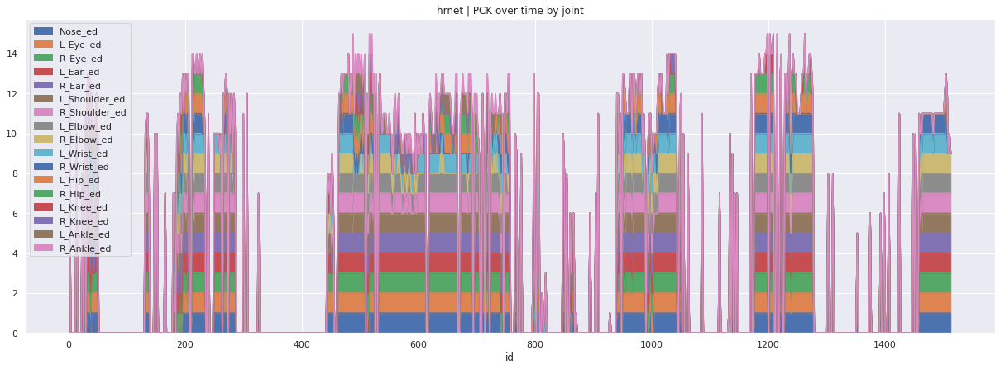

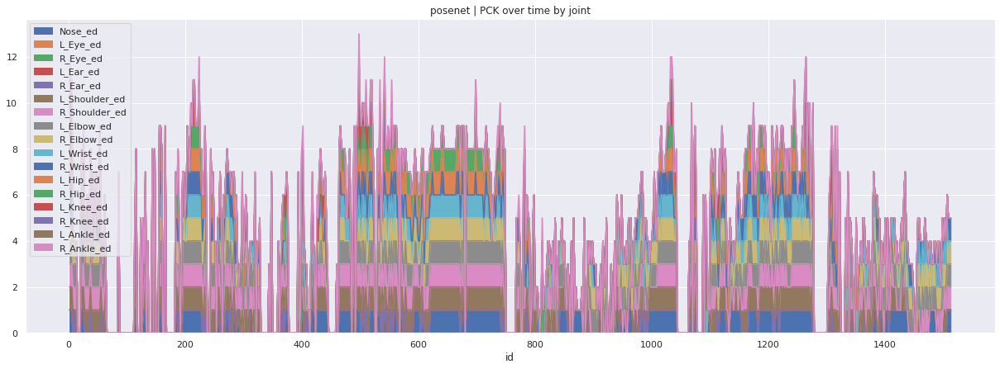

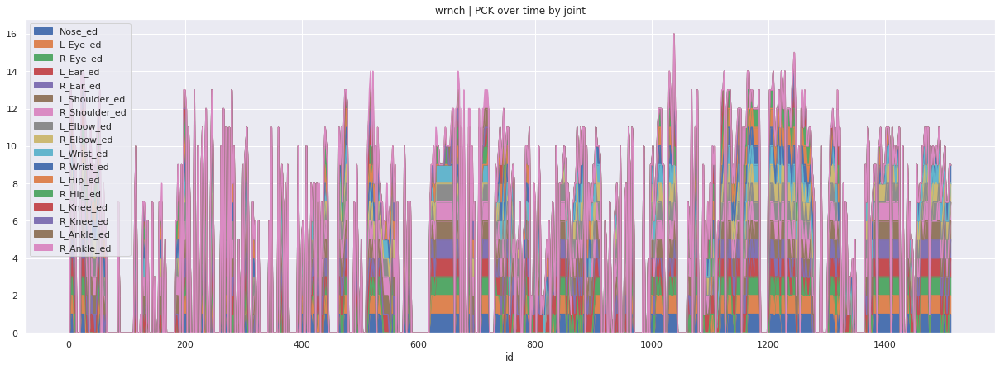

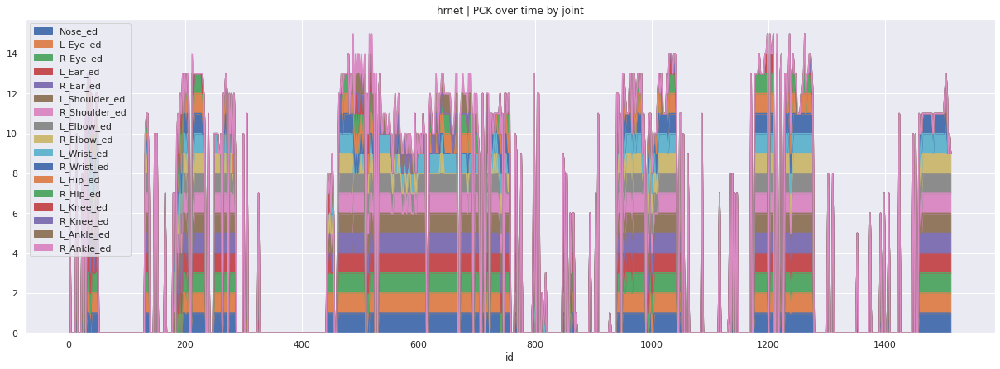

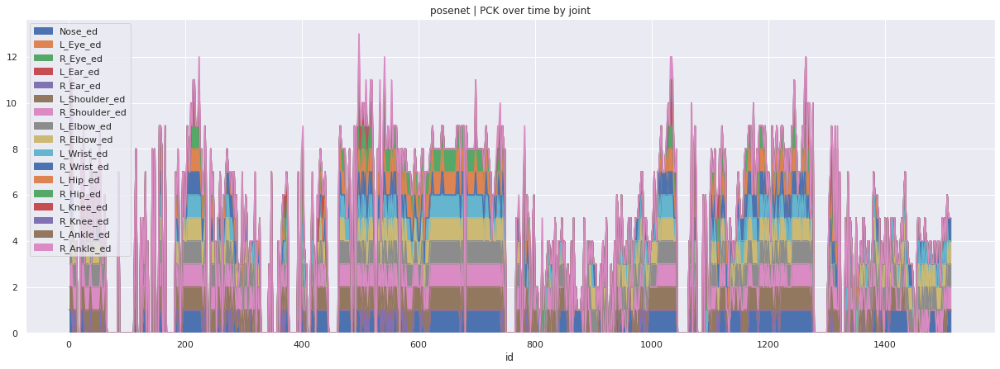

...

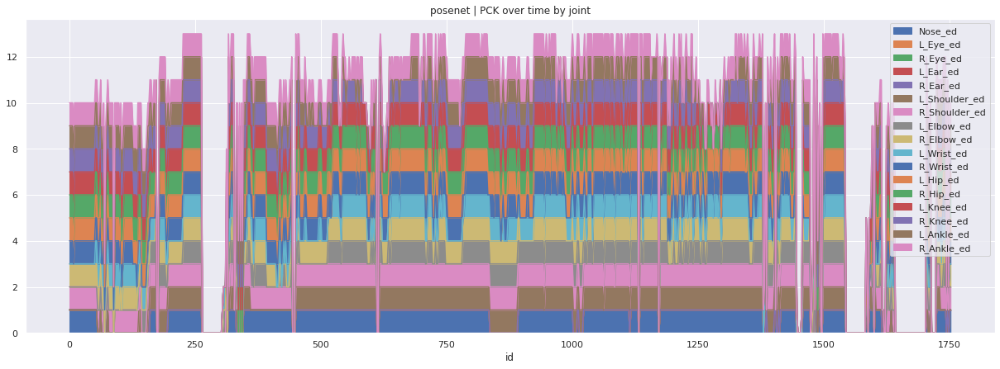

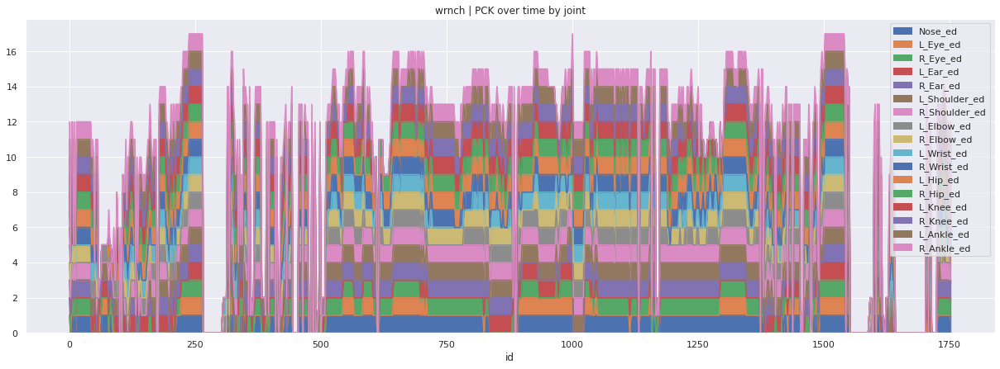

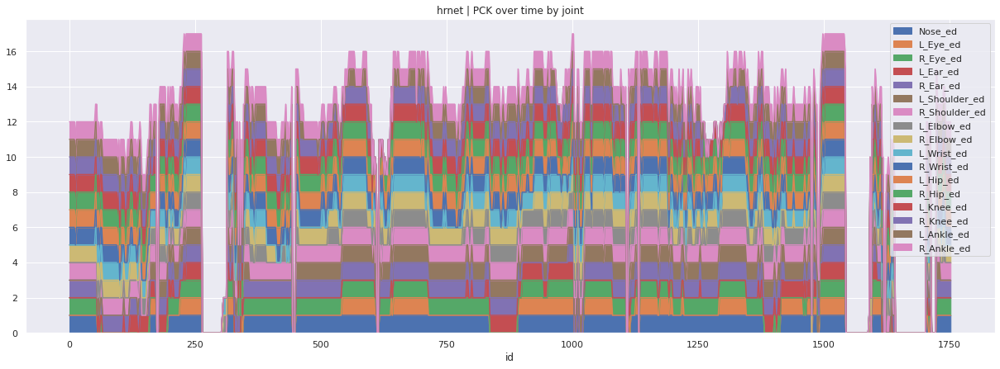

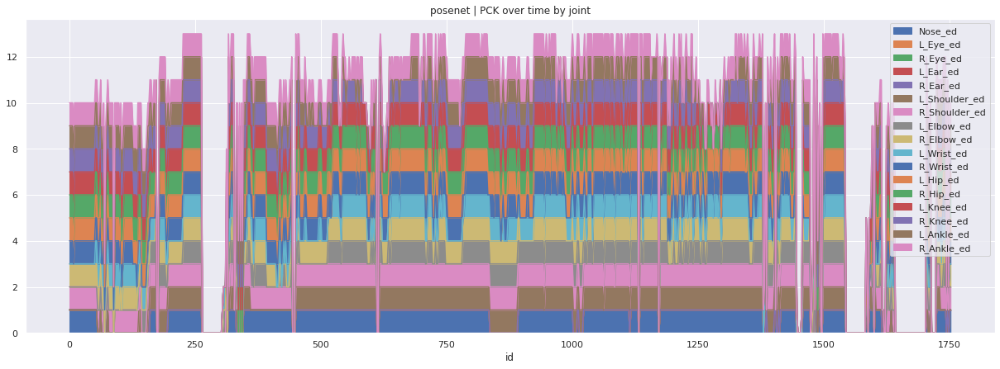

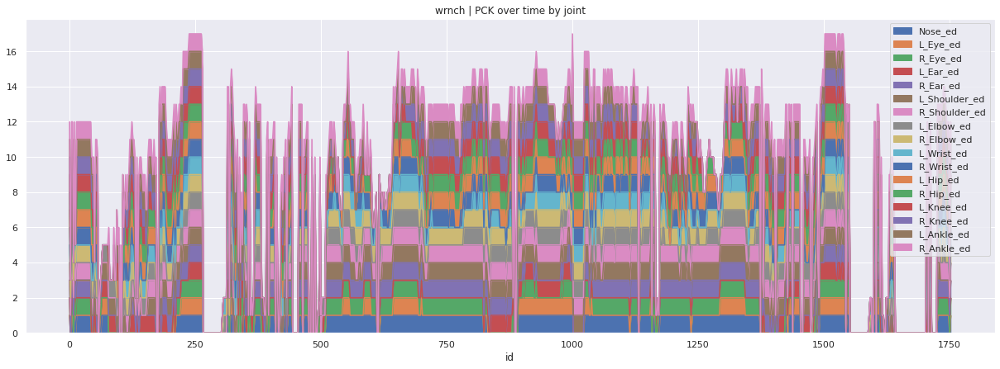

In [7]:
files = ['BAR-S_water_ballon', 
          'MEMIC_profile_view_lab_coat_legs_missing_1', 
          'AFG_subject_switching_close_nurses_subjects1',
        'MERCER_box_slamming1']

thresholds = [0, .1, .4, .6]
summaries = {}
for file in files:
    multiple_subjects = False
    gt_df = get_gt_df(file, multiple_subjects)
    shape = get_size(gt_df, file)
    height, width = shape[:2]
    hrnet_df, posenet_df, wrnch_df = get_hrnet_posenet_wrnch_dfs(file, width, height)
    for t in thresholds:
        summary = pck_calc(gt_df, [hrnet_df, posenet_df, wrnch_df], ["hrnet", "posenet", "wrnch"], threshold=t)
        if (not (file in summaries)):
            summaries[file] = {}
            
        summaries[file][t] = summary
        

    

In [8]:
summaries

{'BAR-S_water_ballon': {0: {'hrnet': [0.49603174603174605, 0.6483137254901961],
   'posenet': [0.8002645502645502, 0.3501215362177929],
   'wrnch': [0.6335978835978836, 0.5305170084735356]},
  0.1: {'hrnet': [0.49603174603174605, 0.6828984543792588],
   'posenet': [0.794973544973545, 0.46013055164469474],
   'wrnch': [0.6322751322751323, 0.6204272753877671]},
  0.4: {'hrnet': [0.4894179894179894, 0.7703615415176798],
   'posenet': [0.794973544973545, 0.46013055164469474],
   'wrnch': [0.6296296296296297, 0.7220069345298796]},
  0.6: {'hrnet': [0.4880952380952381, 0.8732754215636178],
   'posenet': [0.794973544973545, 0.46013055164469474],
   'wrnch': [0.6164021164021164, 0.7950403346280251]}},
 'MEMIC_profile_view_lab_coat_legs_missing_1': {0: {'hrnet': [0.926873857404022,
    0.46049425687434736],
   'posenet': [0.8226691042047533, 0.40183006535947713],
   'wrnch': [0.8957952468007313, 0.44213685474189673]},
  0.1: {'hrnet': [0.926873857404022, 0.4916284261441151],
   'posenet': [0.82

[0.5392724330395108, 0.5560015560544783, 0.6194369956895772, 0.6744271295316486]
[0.4023152188538638, 0.5266743449565633, 0.5266743449565633, 0.5266743449565633]
[0.4983219697421958, 0.6127724066816074, 0.692023437062635, 0.7572586260922338]


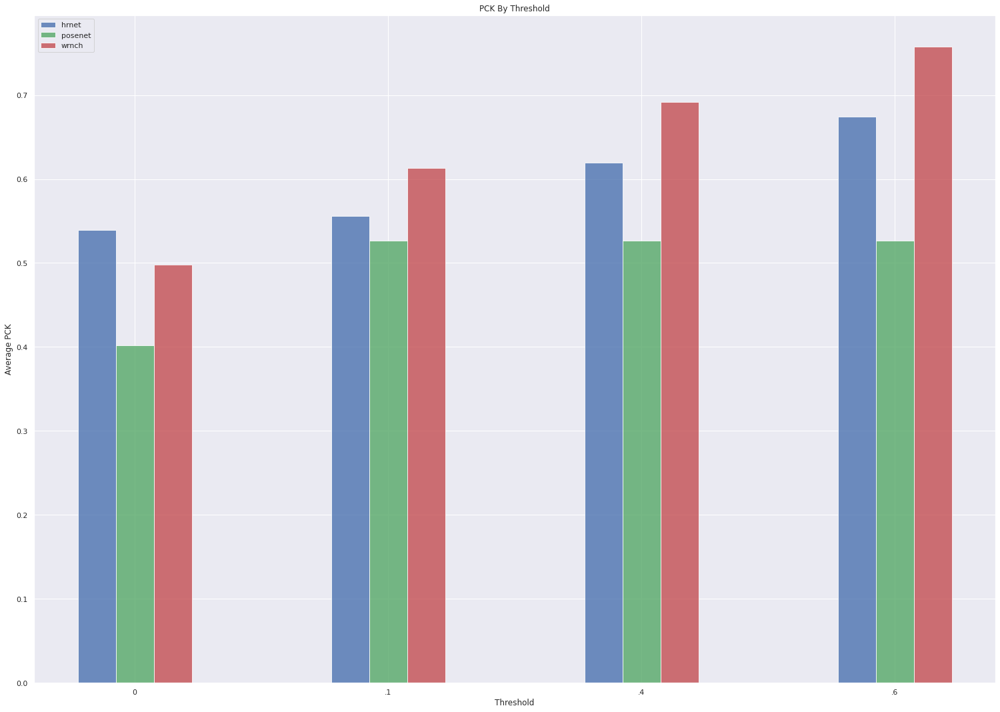

In [11]:
import matplotlib.pyplot as plt
import numpy as np

thresholds = [0, .1, .4, .6]
n_groups = len(thresholds)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.15
opacity = 0.8
colors = ['b', 'g', 'r']
i = 0
for model in ['hrnet', 'posenet', 'wrnch']:
    array = []
    for t in thresholds:
        avg = 0
        for key in summaries:
            avg += summaries[key][t][model][1]
       
        array.append(avg/4)
    print(array)
    rects1 = plt.bar(index, array, bar_width,
    alpha=opacity,
    color=colors[i],
    label=model)
    index = index + bar_width
    i += 1
plt.xlabel('Threshold')
plt.ylabel('Average PCK')
plt.title('PCK By Threshold')
plt.xticks(np.arange(n_groups) + bar_width, ('0', '.1', '.4', '.6'))
plt.legend()

plt.tight_layout()
plt.show()